* Loaded Needed Libraries

In [30]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf

* Loaded Data File 
1. Train Data 
2. Test Data 
3. Predicted Data

In [50]:
trainpath = 'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_train\\seg_train'
testpath  = 'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_test'
predpath  = 'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_pred\\seg_pred'

In [53]:
for folders in  os.listdir(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_train\\seg_train') : 
    files = gb.glob(pathname= str( r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_train\\seg_train\\' + folders + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folders}')

For training data , found 2191 in folder buildings
For training data , found 2271 in folder forest
For training data , found 2404 in folder glacier
For training data , found 2512 in folder mountain
For training data , found 2274 in folder sea
For training data , found 2382 in folder street


In [52]:
for folder in  os.listdir(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_test\\seg_test') : 
    files = gb.glob(pathname= str( r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_test\\seg_test\\'+ folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 437 in folder buildings
For testing data , found 474 in folder forest
For testing data , found 553 in folder glacier
For testing data , found 525 in folder mountain
For testing data , found 510 in folder sea
For testing data , found 501 in folder street


In [90]:
#files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
files = gb.glob(pathname= str(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_pred\\seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


In [96]:
size = []
for folder in  os.listdir(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_train\\') : 
    files = gb.glob(pathname= str( r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_train/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

C:\Users\Alhou\AppData\Local\Temp\ipykernel_3564\376073788.py:7: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  pd.Series(size).value_counts()


Series([], dtype: int64)

In [97]:
size = []
for folder in  os.listdir(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_test\\seg_test') : 
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

C:\Users\Alhou\AppData\Local\Temp\ipykernel_3564\2469899695.py:7: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  pd.Series(size).value_counts()


Series([], dtype: int64)

In [100]:
size = []
files = gb.glob(pathname=str(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_pred\\seg_pred/*.jpg'))
for file in files: 
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

(150, 150, 3)    7288
(133, 150, 3)       1
(139, 150, 3)       1
(108, 150, 3)       1
(124, 150, 3)       1
(131, 150, 3)       1
(144, 150, 3)       1
(149, 150, 3)       1
(143, 150, 3)       1
(129, 150, 3)       1
(100, 150, 3)       1
(112, 150, 3)       1
(126, 150, 3)       1
(374, 500, 3)       1
dtype: int64

In [118]:
#r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_pred\\seg_pred/*.jpg'
s = 100
X_train = []
y_train = []
for folder in  os.listdir(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_train\\seg_train') : 
    files = gb.glob(pathname= str( r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_train\\seg_train//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(list[folder])


In [119]:
print(f'we have {len(X_train)} items in X_train')

we have 14034 items in X_train


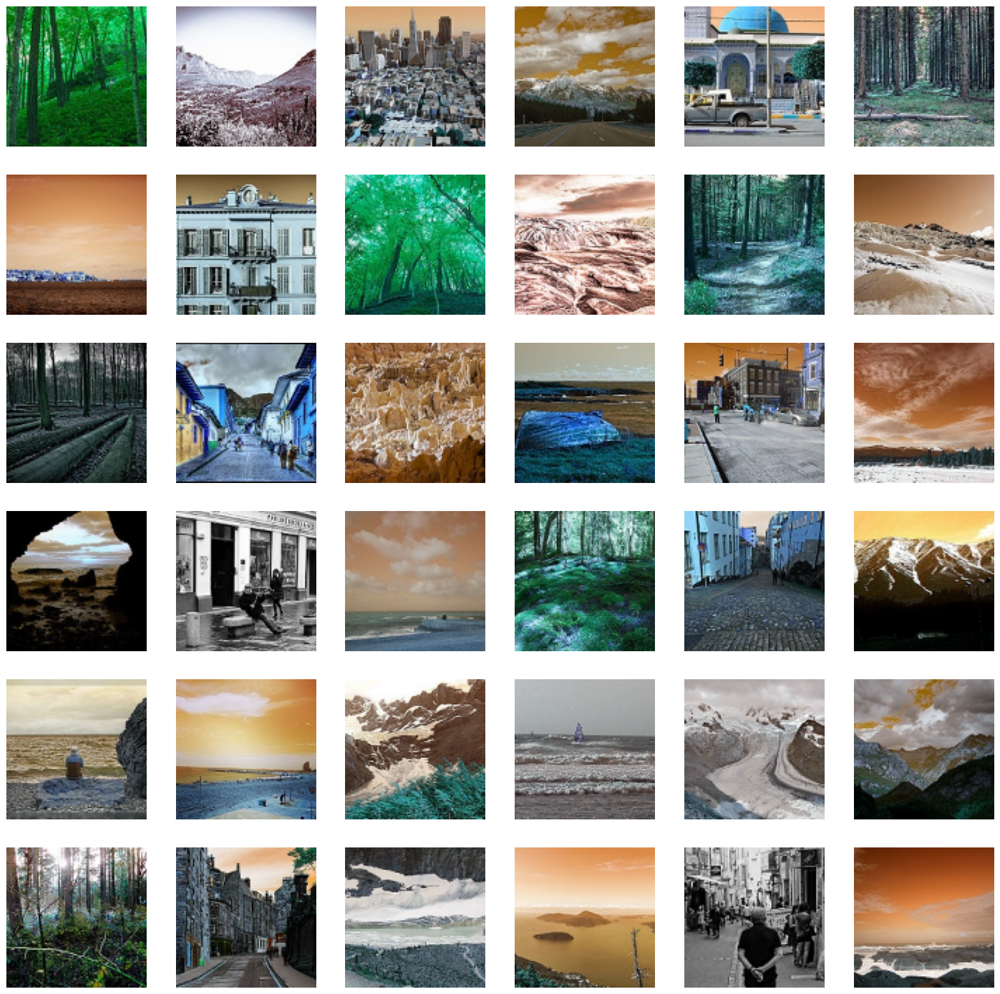

In [120]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])   
    plt.axis('off')
    #plt.title((y_train[i]))

In [122]:
X_test = []
y_test = []
for folder in  os.listdir(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_test\\seg_test') : 
    files = gb.glob(pathname= str(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_test\\seg_test//' + folder + '/*.jpg'))
    for file in files: 
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(list[folder])

In [123]:
print(f'we have {len(X_test)} items in X_test')

we have 3000 items in X_test


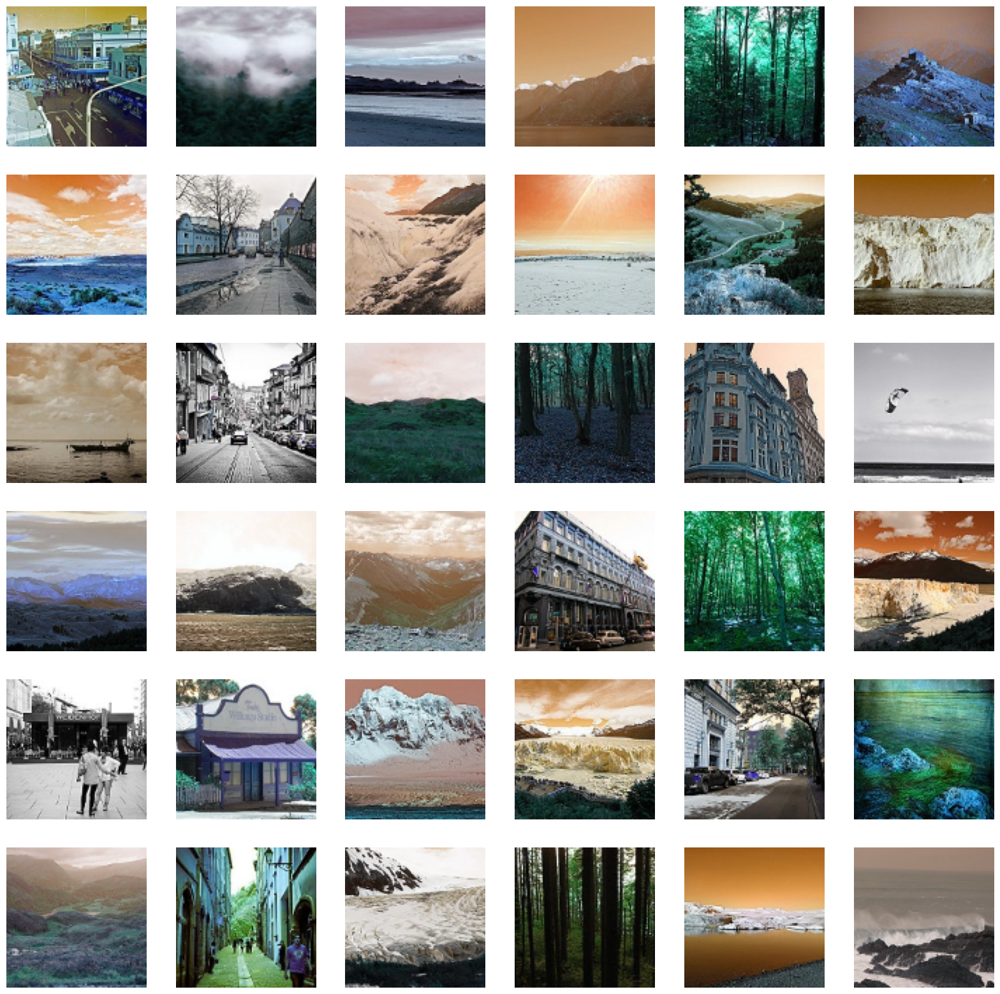

In [124]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])    
    plt.axis('off')
    #plt.title(getcode(y_test[i]))

In [125]:
#files = gb.glob(pathname= str(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_pred\\seg_pred/*.jpg'))
X_pred = []
files = gb.glob(pathname= str(r'C:\\Users\\Alhou\\OneDrive\\Desktop\\seg_pred\\seg_pred/*.jpg'))
for file in files: 
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))

In [110]:
print(f'we have {len(X_pred)} items in X_pred')

we have 7301 items in X_pred


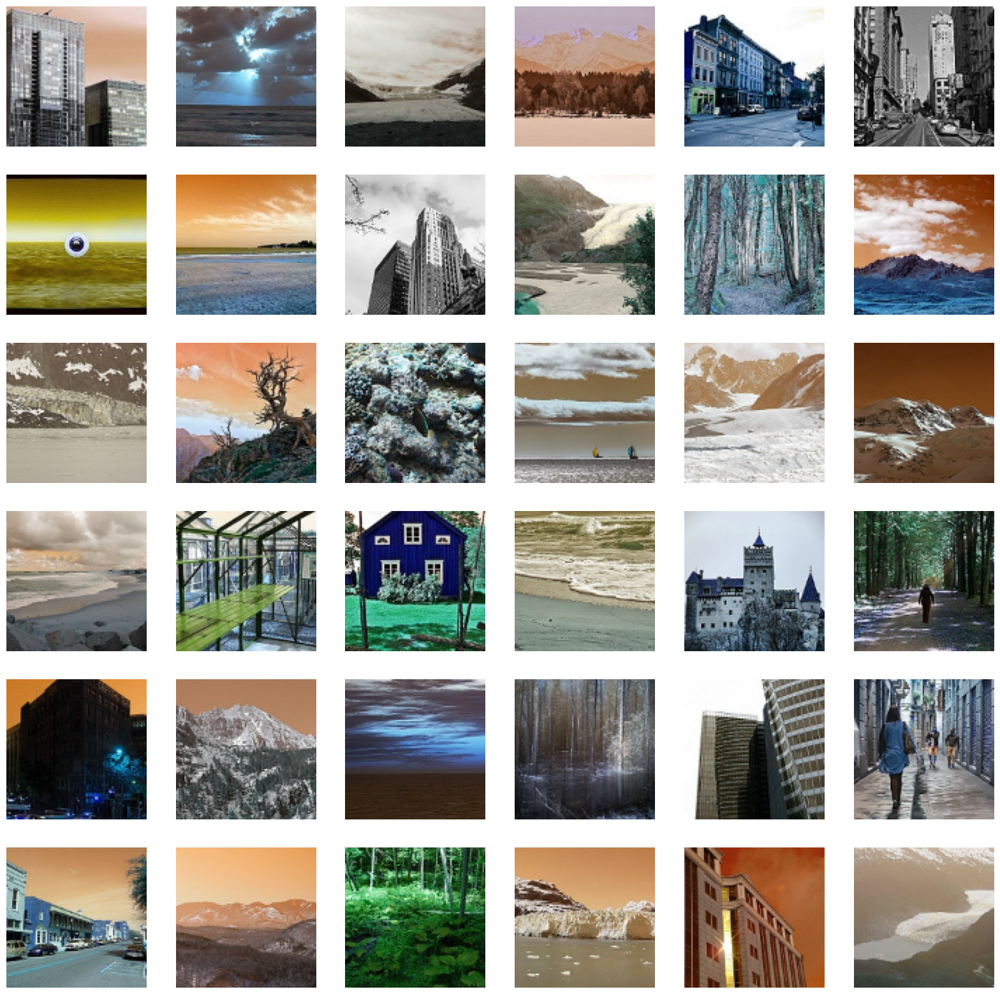

In [126]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) : 
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])    
    plt.axis('off')

In [127]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)
print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

X_train shape  is (14034, 100, 100, 3)
X_test shape  is (3000, 100, 100, 3)
X_pred shape  is (7301, 100, 100, 3)
y_train shape  is (14034,)
y_test shape  is (3000,)
